

 <h1>  <center> <b> Speech Systems (EE6307) </b> </center>

<dt> <h4> <b> Programming Assignment - 03 : Spectrogram Analysis and Feature Extraction </b> </h4> </dt>



<dt> <h4>  $\underline{\textbf{Objective}}$:
Welcome to the third programming assignment in the speech systems (EE6307) course. The current programming assignment aims to compute and analyze different speech sound spectrograms and extract the features from the speech signal. This programming assignment is broadly classified into four parts. The first part of the programming assignment aims to compute the spectrogram and the second part mainly deals with analyzing speech sounds using the spectrogram. The third part of this programming assignment expects you to code an algorithm to compute the cepstral coefficients from the speech signal and analyze the contributions of different coefficients with the help of reconstructed spectrograms/wave files from the modified cepstral coefficients, i.e., replacing a few coefficients with zeros. Lastly, in the fourth part, you need to write a code to extract Mel Frequency Cepstral Coefficients (MFCCs) from the speech signal and pre-process them using Cepstral Mean Variance Normalization (CMVN) algorithm to remove the effect of stationary convolutive noise. The fourth part of the assignment also expects you to analyze the contributions of different coefficients in MFCCs by reconstructing the spectrogram/wave file from the modified MFCCs. We request you to go through the
Non-negative Least Mean Square (NLMS) algorithm to extract the linear spectrogram from the mel spectrogram and Griffinlim algorithm to compute the waveform from the linear spectrogram. </h4> </dt>

[Non-negative Least Mean Square (NLMS)](https://drive.google.com/file/d/13qYbCbeRzCmfTmU7z6AkiuhFvb5M3GIE/view)

[Griffinlim algorithm](https://drive.google.com/file/d/13qYbCbeRzCmfTmU7z6AkiuhFvb5M3GIE/view)

<dt> <h4>  <b> $\underline{\textbf{Instructions}}$: </b> Please follow these instructions </h4> </dt>
<dd> <h4>  1. Plagiarism is strictly prohibited. </h4> </dd>
<dd> <h4>  2. Delayed submissions will be penalized with a scaling factor of 0.5 per day. </h4> </dd>
<dd> <h4>  3. Please DO NOT use any machine learning libraries unless and otherwise specified. </h4> </dd>







<h4> <b> Part1 (Compute and plot the Short-Time Fourier Transfrom (STFT) of the speech signal) : </b>  This section describes the steps involved in computing the spectrogram of the speech signal and also restoring the speech signal from the the spectrogram.   </h4>

<dt> <h4> 1. Compute and plot the spectrogram </h4> </dt>

<dd> <h5> i. Segment the speech signal into short-time frames $s[n]$: 'frame_length'  and 'frame_step'. </h5> </dd>
<dd> <h5> ii. Compute 'N' point DFT of each of the frame $S[n,k]$, where $n$ denotes time-frame and $k$ denotes frequency bin. </h5> </dd>
<dd> <h5> iii. Compute log-manitude spectrum of each frame in decibels: $20\log|S[n,k]|$. </h5> </dd>
<dd> <h5> iv. Plot the matrix containing log magnitude spectra as a 3-D plot, time along $x$-axis, frequency along $y$-axis and magnitude of time-frequency bin as the intensity of the pixel. You can 'imshow' function to achieve this. </h5> </dd>
<dd> <h5> v. Write a function to plot waveform and spectrogram as subplots of a single figure with aligned time-axis. </h5> </dd>

<dt> <h4> 2. Plot narrow-band and wide-band spectrogram </h4> </dt>

<dd> <h5> i. Plot narrow-band and wide-band spectrograms of a male and female speakers.
 </h5> </dd>
<dd> <h5> ii. Report the 'frame_length' and 'frame_step' used in each of these cases. What are your observations </h5> </dd>

<dt> <h4> 3. Phase reconstruction - Reconstruct the waveform from the spectrogram </h4> </dt>

<dd> <h5>

i. Implement [Griffin-Lim algorithm](https://ieeexplore.ieee.org/document/1164317) to reconstruct speech signal from the magnitude of the STFT, i.e., $|S[n,k]|$

</h5> </dd>


In [1]:
# All imports
from IPython.display import Javascript
from google.colab import output, drive
from base64 import b64decode
from io import BytesIO
!pip -q install pydub
from pydub import AudioSegment
import soundfile as sf
import matplotlib.lines as mlines
import scipy.io.wavfile
import io
import os
import numpy as np
from numpy.lib import stride_tricks
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from matplotlib import cm

In [2]:
RECORD = """
const sleep  = time => new Promise(resolve => setTimeout(resolve, time))
const b2text = blob => new Promise(resolve => {
  const reader = new FileReader()
  reader.onloadend = e => resolve(e.srcElement.result)
  reader.readAsDataURL(blob)
})
var record = time => new Promise(async resolve => {
  stream = await navigator.mediaDevices.getUserMedia({ audio: true })
  recorder = new MediaRecorder(stream)
  chunks = []
  recorder.ondataavailable = e => chunks.push(e.data)
  recorder.start()
  await sleep(time)
  recorder.onstop = async ()=>{
    blob = new Blob(chunks)
    text = await b2text(blob)
    resolve(text)
  }
  recorder.stop()
})
"""

def record(sec=3):
  display(Javascript(RECORD))
  s = output.eval_js('record(%d)' % (sec*1000))
  b = b64decode(s.split(',')[1])
  audio = AudioSegment.from_file(BytesIO(b))
  return audio

In [ ]:
if os.path.isfile('recording.wav'):
    print("wavefile exists, later part of the code uses 'recording.wav' as input speech")
    (rate,sig) = scipy.io.wavfile.read("recording.wav")
    print(len(sig))
else:
    print("There is no file in the current directory, please record your voice")
    print("Recording started!")
    wav = record(3.0) #It will record three seconds of your speech
    wav = wav.set_frame_rate(16000)
    sig=wav.get_array_of_samples()
    samples=np.array(sig).T.astype(np.float32)
    fp_arr = np.array(samples).T.astype(np.float32)
    fp_arr /= np.iinfo(sig.typecode).max
    scipy.io.wavfile.write('recording.wav', 16000, fp_arr)
    plt.plot(fp_arr)
    plt.show()

In [3]:
##########################################################
##########################################################

def stft(sig, rate, frameSize ,hopSize ,window=np.hanning):

    #1.Segment the speech signal into short time frames ( You may use "stride_tricks.as_strided" with appropriate arguments )
    frameSize = int(rate * frameSize)
    hopSize = int(rate * hopSize)

    num_frames = 1 + (len(sig) - frameSize) // hopSize
    shape = (num_frames, frameSize)
    strides = (sig.strides[0] * hopSize, sig.strides[0])

    Frames = stride_tricks.as_strided(sig, shape=shape, strides=strides).copy()

    win = window(frameSize)

    #2.Multiply the frames with the window ( i.e rectangular, hamming, hanning etc )
    windowed_frames = [frame * win for frame in Frames]

    #3.Compute N-point DFT of of the frames ( You may use "np.fft.rfft" with appropriate arguments )
    NFFT = 512
    mag_frames = [np.fft.rfft(windowed_frame, NFFT) for windowed_frame in windowed_frames]

    #4.Compute Log magnitude spectrum of the frames in decibles
    log_spec = np.array([20 * np.log10(np.abs(frame + 1e-6)) for frame in mag_frames])

    #5.Return Log magnitude spectrogram
    return log_spec

##########################################################
##########################################################

In [4]:
##########################################################
#Write a function to plot the spectrogram of the signal
##########################################################

def plotstft(sig, rate, frameSize, hopSize, label = None):

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 6))

    # Plot the waveform
    ax1.plot(sig)
    ax1.grid()

    if label == None:
      ax1.set_title('Waveform')
    else:
      ax1.set_title(f'{label} - Waveform')

    ax1.set_xlabel('Time (s)')
    ax1.set_ylabel('Amplitude')

    # Compute the spectrogram
    S = stft(sig, rate, frameSize, hopSize)
    frequencies = np.fft.rfftfreq(n=512, d=1./rate)
    frameSize = int(rate * frameSize)
    hopSize = int(rate * hopSize)

    norm = plt.Normalize(vmin=S.min(), vmax=S.max())
    colormap = cm.get_cmap('Greys')

    # Loop through each frame and frequency, plotting them with color based on intensity
    for index, frame in enumerate(S):
        start = index * hopSize  # Start time index in samples
        for freq_index, intensity in enumerate(frame):
            time = np.arange(start, start + frameSize)  # Time indices for the frame
            frequency = frequencies[freq_index] # Corresponding frequency

            # Get the grayscale color based on the intensity
            color = colormap(norm(intensity))

            # Plot the frequency component across time
            ax2.plot(time, [frequency] * len(time), color=color)

    ax2.grid()

    if label == None:
      ax2.set_title('Spectrogram')
    else:
      ax2.set_title(f'{label} - Spectrogram')

    ax2.set_xlabel('Time (s)')
    ax2.set_ylabel('Frequency (Hz)')

    plt.show()


##########################################################
##########################################################

<ipython-input-8-98bb2ddd36d0>:28: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('Greys')


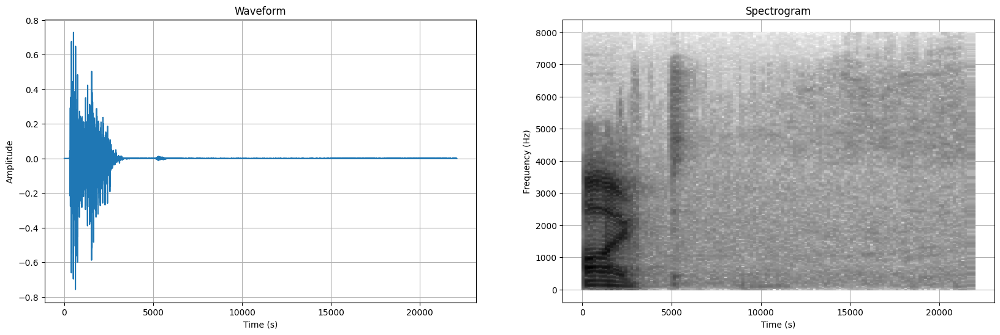

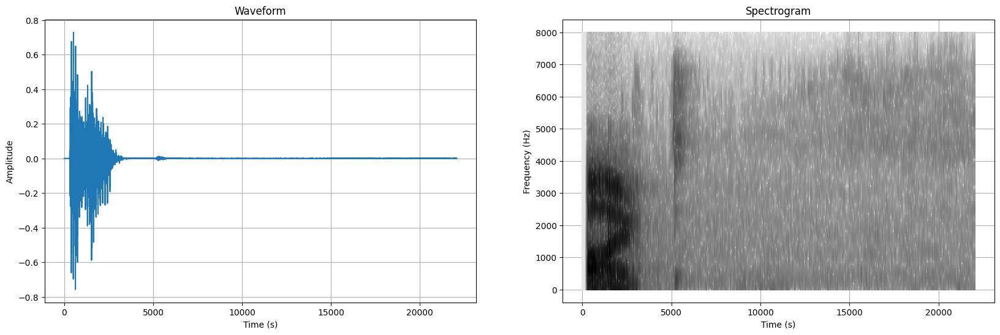

In [9]:
wav_path='male_a.wav'
sig, sr = sf.read(wav_path)

##########################################################
#Plot narrow band spectrogram : Set frameSize to cover at least one pitch period
##########################################################
frameSize = 0.025
hopSize = 0.010
plotstft(sig, sr, frameSize, hopSize)

##########################################################
#Plot wide band spectrogram : Set frameSize as less than one pitch period
##########################################################
frameSize =0.005
hopSize = 0.004
plotstft(sig, sr, frameSize, hopSize)


In [5]:
##########################################################
#Compute the speech signal from the spectrogram - Use Griffin Lim Algorithm to estimate the phase
##########################################################

def ReconstructSignal(MagSpec):

    ##########################################################
    #Steps
    phase = np.exp(2j * np.pi * np.random.rand(*MagSpec.shape))

    spec = MagSpec * phase

    signal = np.fft.ifft(spec, 512)

    for i in range(20):
      # Perform STFT on the signal
      spec = np.fft.fft(signal, 512)

      # Compute the magnitude of the STFT
      mag_spec = np.abs(spec)

      # Update the phase while keeping the magnitude same
      phase = np.exp(1j * np.angle(spec))
      spec = mag_spec * phase

      # Inverse STFT to reconstruct the signal
      signal = np.fft.ifft(spec, 512)

    return signal
    ##########################################################
    ##########################################################

/usr/local/lib/python3.10/dist-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


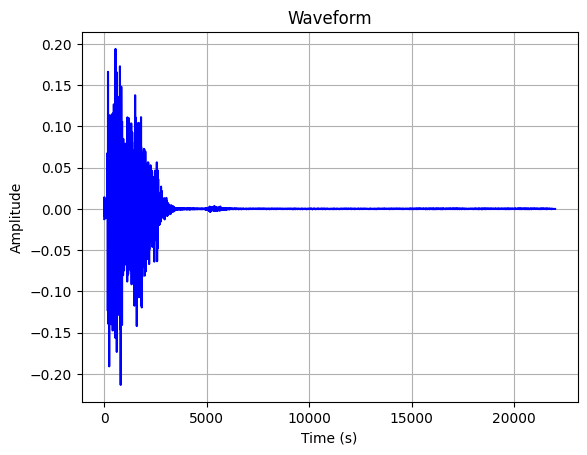

In [11]:
wav_path='male_a.wav'
sig, sr = sf.read(wav_path)


frameSize =int(sr * 0.025)
hopSize = int(sr *0.010)

num_frames = 1 + (len(sig) - frameSize) // hopSize
shape = (num_frames, frameSize)
strides = (sig.strides[0] * hopSize, sig.strides[0])

Frames = stride_tricks.as_strided(sig, shape=shape, strides=strides).copy()

win = np.hanning(frameSize)

#2.Multiply the frames with the window ( i.e rectangular, hamming, hanning etc )
windowed_frames = [frame * win for frame in Frames]

#3.Compute N-point DFT of of the frames ( You may use "np.fft.rfft" with appropriate arguments )
NFFT = 512
S = [np.abs(np.fft.rfft(windowed_frame, NFFT)) for windowed_frame in windowed_frames]

reconstructed_signal = []


for frame in S:

 reconstructed_signal.append(ReconstructSignal(frame))


for index, frame in enumerate(reconstructed_signal):

  start = index*hopSize
  end = start + frameSize

  plt.plot(range(start, end), frame[:frameSize], color = 'b')
plt.title('Waveform')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.grid()
plt.show()


<h4> <b> Part1 Report : </b>  
Write down your observations from the spectrogram ( wideband or narrowband )

<dt> <h4> 1. Is there any difference between wideband and narrowband spectrogram ?   </h4> </dt>
<dd> <h4> - Spectrograms look similar but differ in horizontal/ vertical striations </h4> </dd>

<dt> <h4> 2. Summarize the information that you are able to get from the spectrogram i.e formants, pitch harmonics, horizontal/vertical striations etc   </h4> </dt>
<dd> <h4> - We  can clearly observe that Narrowband spectrogram has horizontal striations while Wideband spectrogramn has vertical striations. </h4> </dd>
<dd> <h4> - This implies wideband provides better time resolution due to small time window while narrowband provides better frequency resolution   </h4> </dd>
<dd> <h4> - We can observe formant frequencies of /a/ around 700-800 Hz and 1000-1100 Hz from the spectrogram </h4> </dd>

<dt> <h4> 3. We observe a good reconstruction of the signal with griffin limm algorithm  </h4> </dt>

<h4> <b> Part2 (Analsysis of speech sounds using spectrograms) : </b>  This sections deals with the analysis of speech sounds using spectrograms.  </h4>

<dt> <h4> <b> 1. Diphthongs: </b> Record diphthongs /ai/ and /au/ as in 'bye' and 'house' and plot their spectrograms. Report your observations about the formant trajectories </h4> </dt>

<dt> <h4> <b> 2. Place of articulation: </b> Record unvoiced stop consonants in the context of /a/ on either side /aka/, /aTa/ and /apa/. Plot their spectrograms. Report your observations about the first second formats. What happend when you replace the vowel /a/ with /i/ and /e/. </h4> </dt>

<dt> <h4> <b> 3. Manner of articulation: </b> Record velar stop consonants in the context of /a/ on either side /aka/, /akha/, /aga/ and /agha/. To be reported: waveform characteristics in the closure regions, waveform characteristics in burst/transition regions, formant transitions in the spectrogram. </h4> </dt>

<dt> <h4> <b> 4. Nasal stops: </b> Record the nasal stops /ama/ and /ana/ and observe spectral valleys. Report the locations of spectral valleys of each of these sounds. </h4> </dt>

<dt> <h4> <b> 5. Glides: </b> Record the glides /aya/ and /ava/ and report observations on formant transitions. What are the closet vowels to thse sounds? Try extending the durations of the glides, and observe the spectral characteristics. </h4> </dt>

<dt> <h4> <b> 6. Fricatives: </b> Record the sounds /asha/, /asa/ and /afa/ and observe their waveform and spectral characteristics. Report the dominant frequency regions for each of these sounds. Repeat it for /aha/ </h4> </dt>


<h1> <b> 1. Dipthongs </b> </h1>



<ipython-input-8-0838b295c6b5>:32: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('Greys')


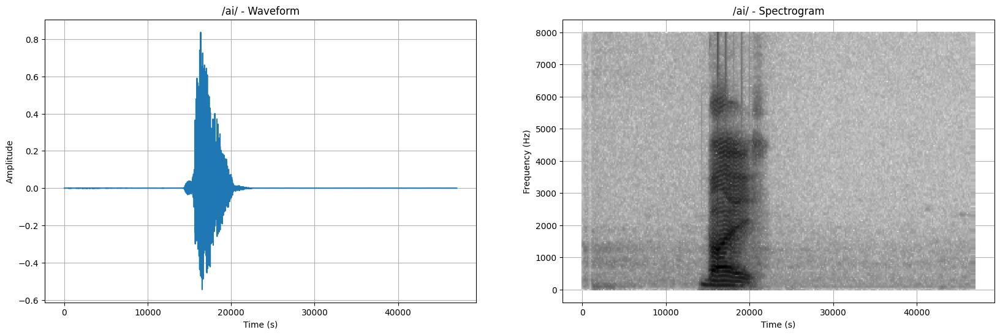

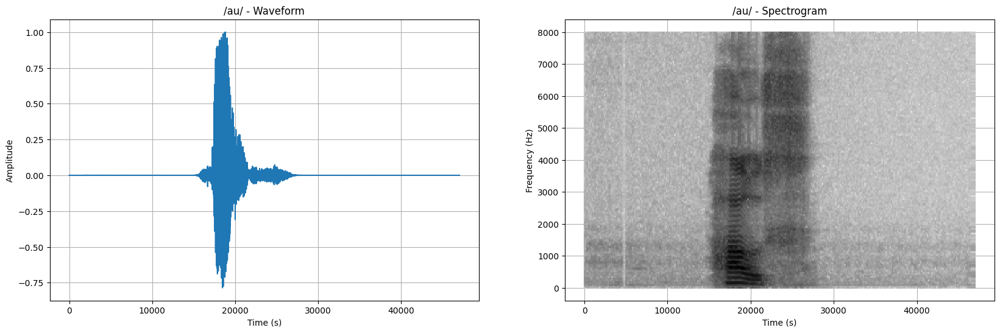

In [ ]:
##########################################################
#Use the speech recording module in assignment 2 or 1 and the stft function in the current assignment to complete the task
##########################################################

wav_path='bye.wav'
sig, sr = sf.read(wav_path)

frameSize = 0.025
hopSize = 0.010
plotstft(sig, sr, frameSize, hopSize, label = '/ai/')

wav_path='house.wav'
sig, sr = sf.read(wav_path)

frameSize = 0.025
hopSize = 0.010
plotstft(sig, sr, frameSize, hopSize, label = '/au/')

<h1> <b> 2. Place of Articulation </b> </h1>

<ipython-input-8-0838b295c6b5>:32: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('Greys')


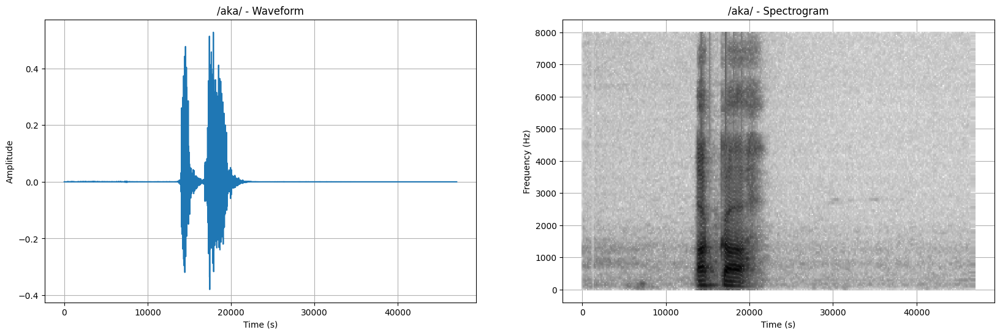

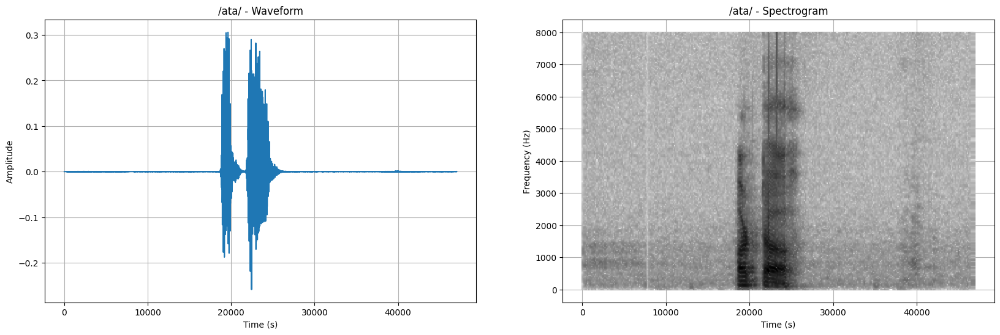

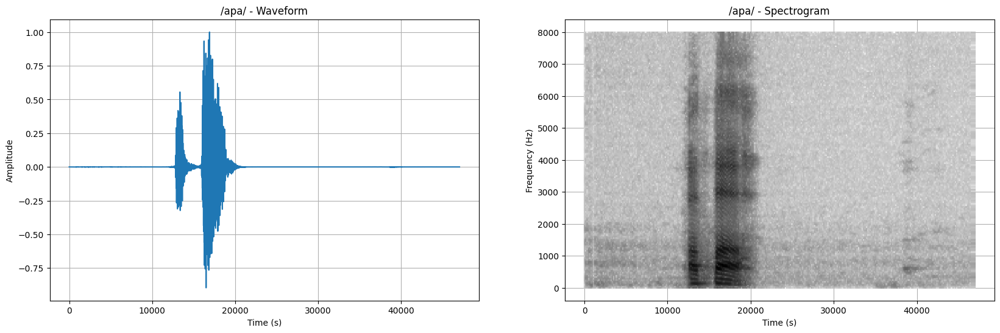

In [ ]:
wav_path='aka.wav'
sig, sr = sf.read(wav_path)

frameSize = 0.025
hopSize = 0.010
plotstft(sig, sr, frameSize, hopSize, label = '/aka/')

wav_path='ata.wav'
sig, sr = sf.read(wav_path)

frameSize = 0.025
hopSize = 0.010
plotstft(sig, sr, frameSize, hopSize, label = '/ata/')

wav_path='apa.wav'
sig, sr = sf.read(wav_path)

frameSize = 0.025
hopSize = 0.010
plotstft(sig, sr, frameSize, hopSize, label = '/apa/')

<ipython-input-8-0838b295c6b5>:32: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('Greys')


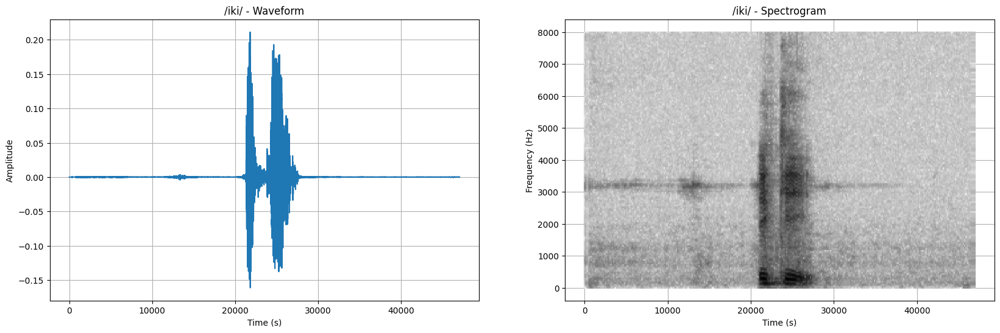

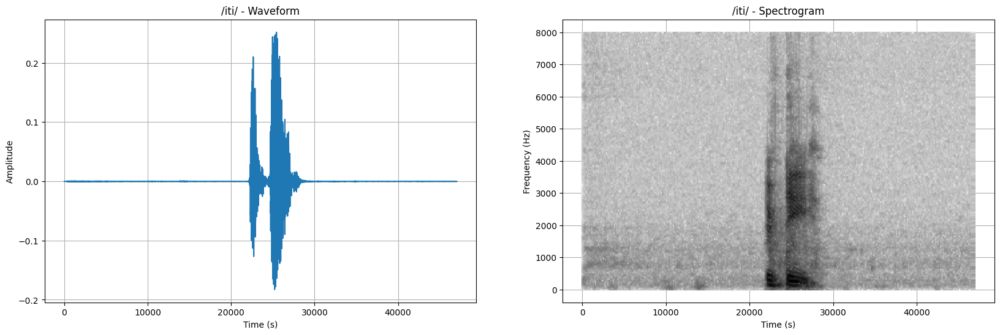

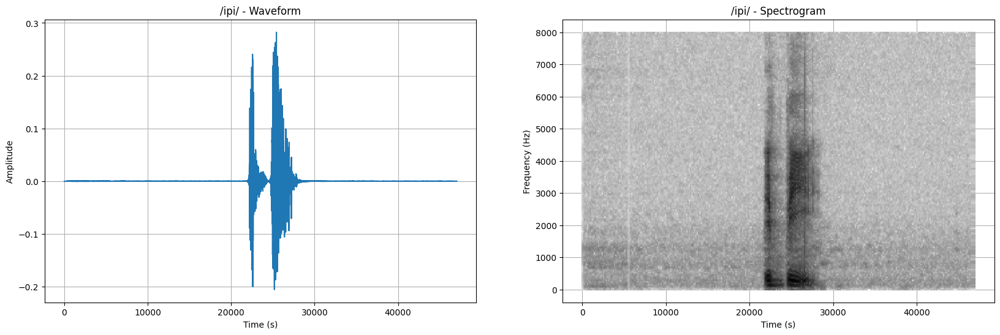

In [ ]:
wav_path='iki.wav'
sig, sr = sf.read(wav_path)

frameSize = 0.025
hopSize = 0.010
plotstft(sig, sr, frameSize, hopSize, label = '/iki/')

wav_path='iti.wav'
sig, sr = sf.read(wav_path)

frameSize = 0.025
hopSize = 0.010
plotstft(sig, sr, frameSize, hopSize, label = '/iti/')

wav_path='ipi.wav'
sig, sr = sf.read(wav_path)

frameSize = 0.025
hopSize = 0.010
plotstft(sig, sr, frameSize, hopSize, label = '/ipi/')

<ipython-input-8-0838b295c6b5>:32: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('Greys')


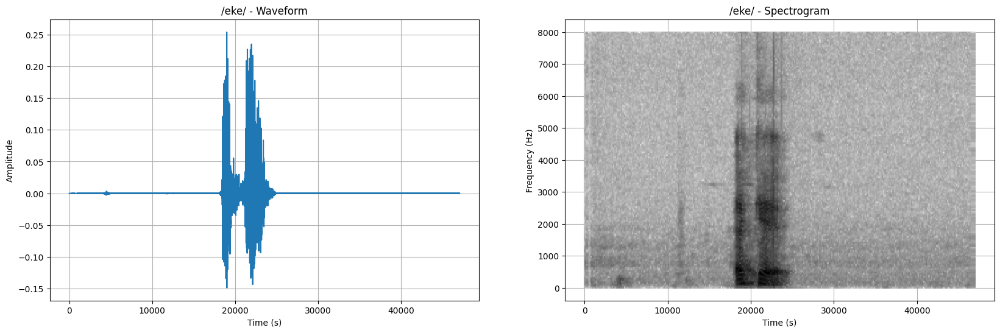

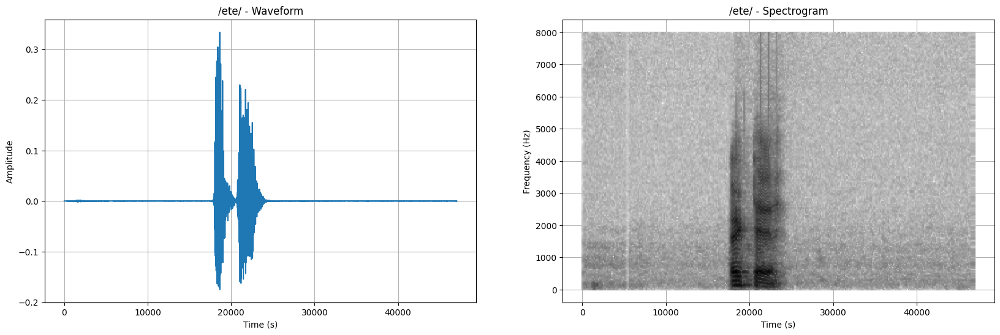

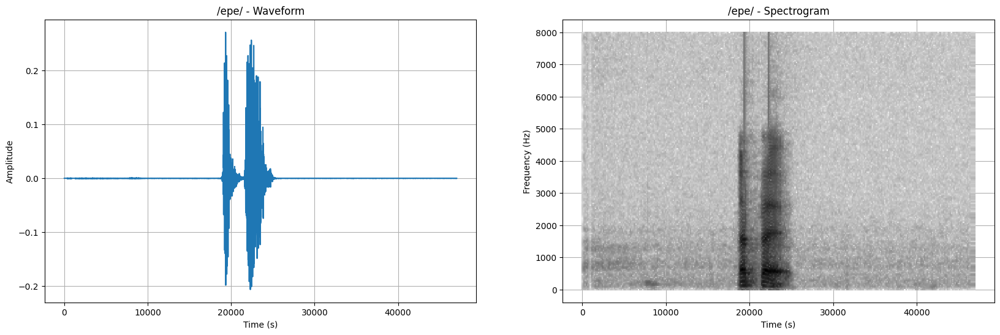

In [ ]:
wav_path='eke.wav'
sig, sr = sf.read(wav_path)

frameSize = 0.025
hopSize = 0.010
plotstft(sig, sr, frameSize, hopSize, label = '/eke/')

wav_path='ete.wav'
sig, sr = sf.read(wav_path)

frameSize = 0.025
hopSize = 0.010
plotstft(sig, sr, frameSize, hopSize, label = '/ete/')

wav_path='epe.wav'
sig, sr = sf.read(wav_path)

frameSize = 0.025
hopSize = 0.010
plotstft(sig, sr, frameSize, hopSize, label = '/epe/')

<h2> <b> 3. Manner of Articulation </b> </h2>

<ipython-input-8-0838b295c6b5>:32: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('Greys')


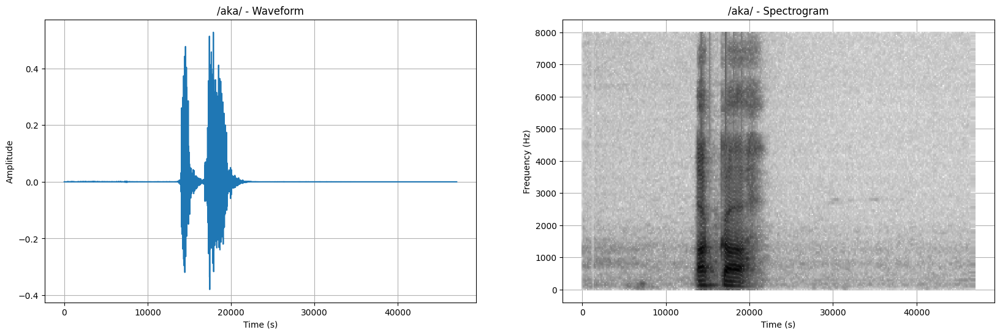

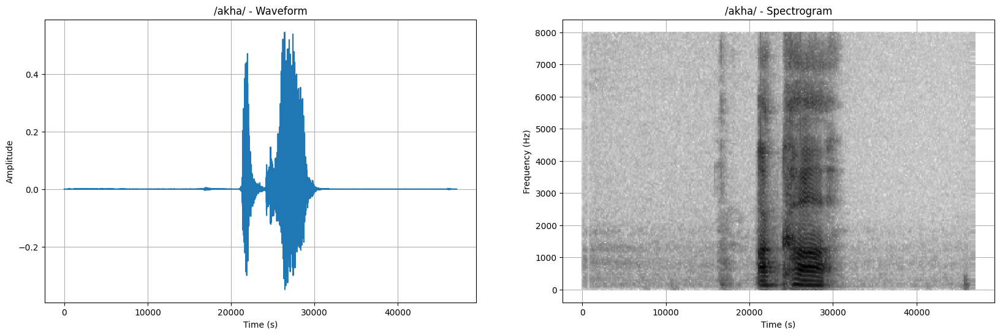

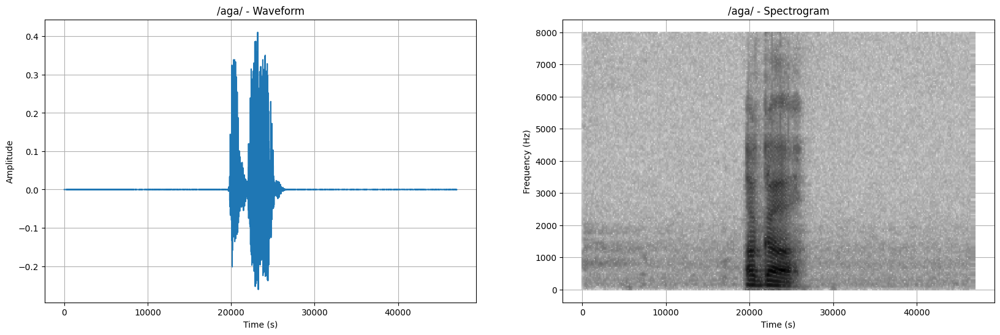

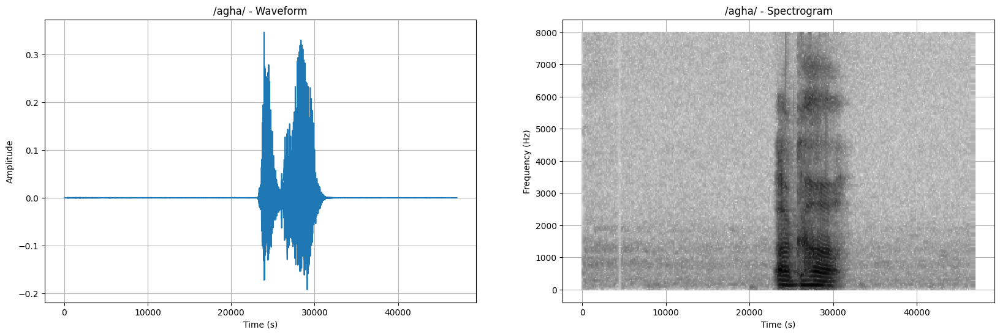

In [ ]:
wav_path='aka.wav'
sig, sr = sf.read(wav_path)

frameSize = 0.025
hopSize = 0.010
plotstft(sig, sr, frameSize, hopSize, label = '/aka/')

wav_path='akha.wav'
sig, sr = sf.read(wav_path)

frameSize = 0.025
hopSize = 0.010
plotstft(sig, sr, frameSize, hopSize, label = '/akha/')

wav_path='aga.wav'
sig, sr = sf.read(wav_path)

frameSize = 0.025
hopSize = 0.010
plotstft(sig, sr, frameSize, hopSize, label = '/aga/')

wav_path='agha.wav'
sig, sr = sf.read(wav_path)

frameSize = 0.025
hopSize = 0.010
plotstft(sig, sr, frameSize, hopSize, label = '/agha/')

<h2> <b> 4. Nasal Stops </b> </h2>

<ipython-input-8-0838b295c6b5>:32: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('Greys')


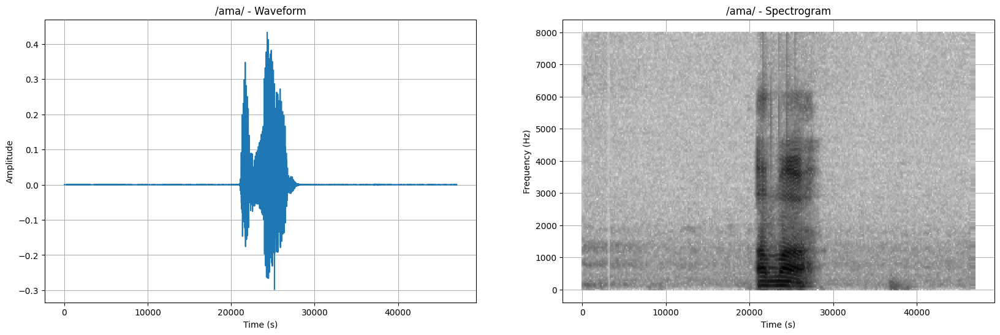

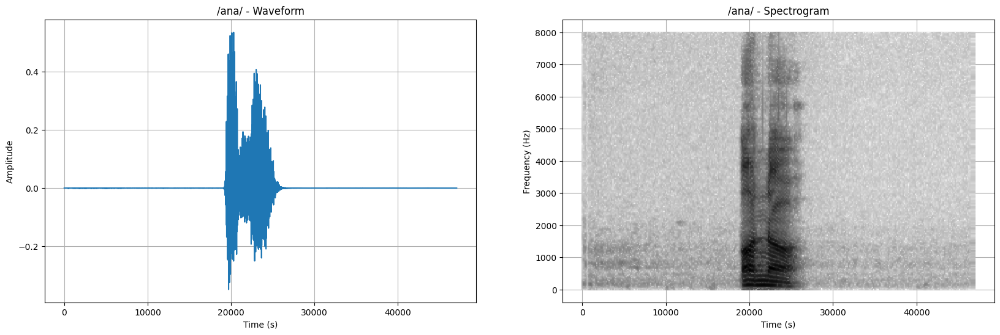

In [ ]:
wav_path='ama.wav'
sig, sr = sf.read(wav_path)

frameSize = 0.025
hopSize = 0.010
plotstft(sig, sr, frameSize, hopSize, label = '/ama/')

wav_path='ana.wav'
sig, sr = sf.read(wav_path)

frameSize = 0.025
hopSize = 0.010
plotstft(sig, sr, frameSize, hopSize, label = '/ana/')


<h2> <b> 5. Glides </b> </h2>

<ipython-input-8-0838b295c6b5>:32: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('Greys')


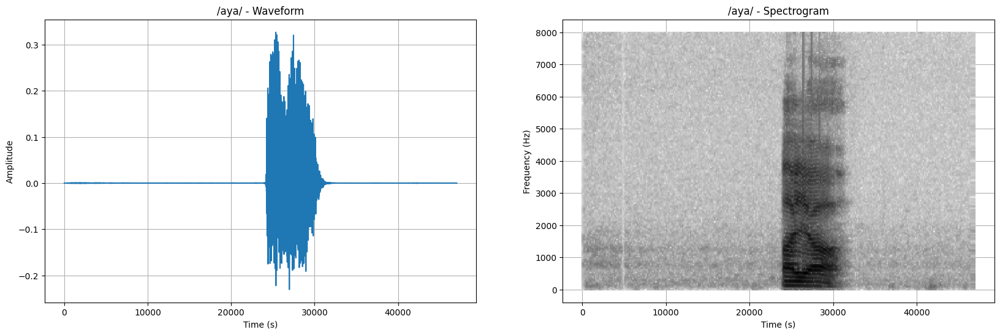

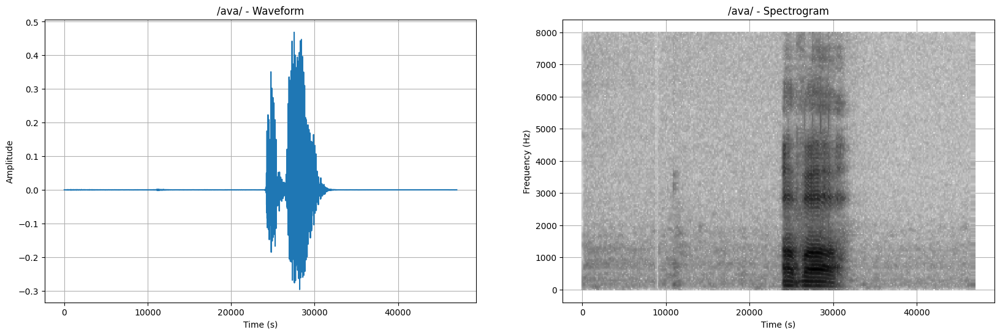

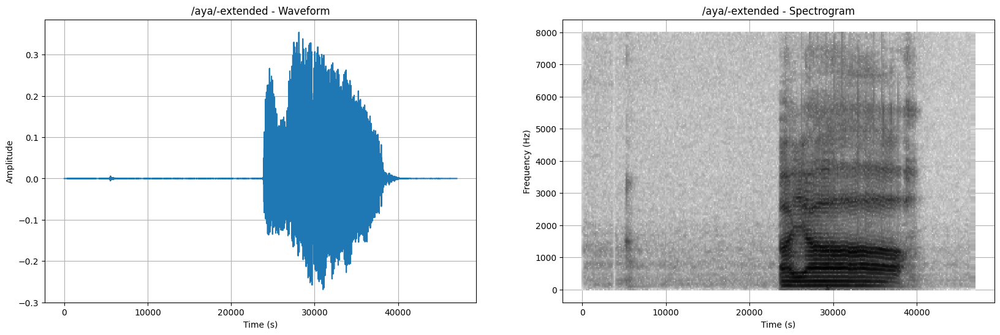

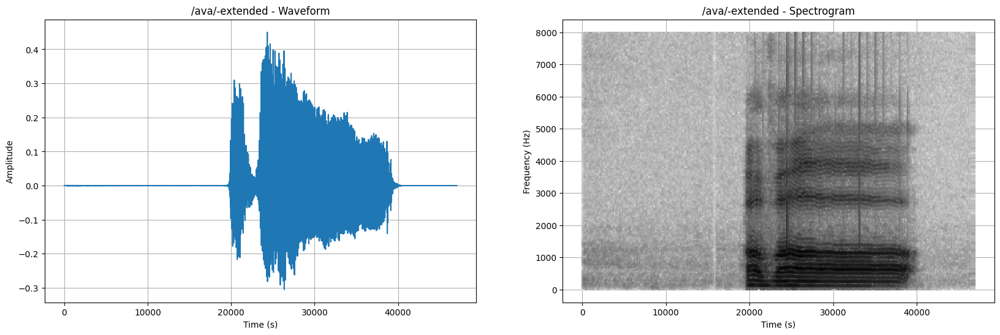

In [ ]:
wav_path='aya.wav'
sig, sr = sf.read(wav_path)

frameSize = 0.025
hopSize = 0.010
plotstft(sig, sr, frameSize, hopSize, label = '/aya/')

wav_path='ava.wav'
sig, sr = sf.read(wav_path)

frameSize = 0.025
hopSize = 0.010
plotstft(sig, sr, frameSize, hopSize, label = '/ava/')

wav_path='aya_extended.wav'
sig, sr = sf.read(wav_path)

frameSize = 0.025
hopSize = 0.010
plotstft(sig, sr, frameSize, hopSize, label = '/aya/-extended')


wav_path='ava_extended.wav'
sig, sr = sf.read(wav_path)

frameSize = 0.025
hopSize = 0.010
plotstft(sig, sr, frameSize, hopSize, label = '/ava/-extended')

<h2> <b> 6. Fricatives </b> </h2>

<ipython-input-8-0838b295c6b5>:32: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('Greys')


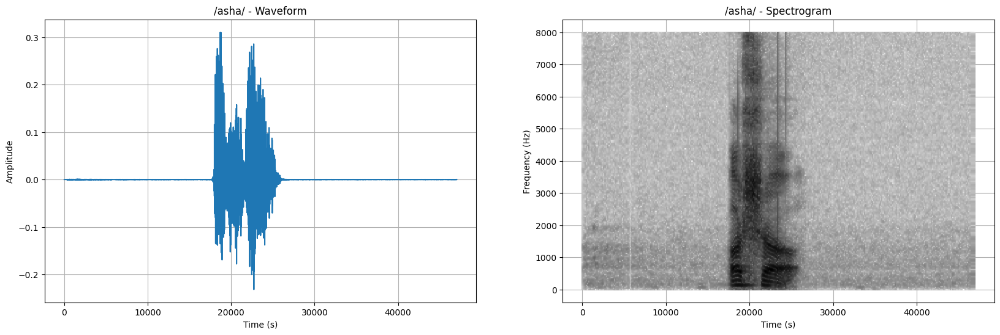

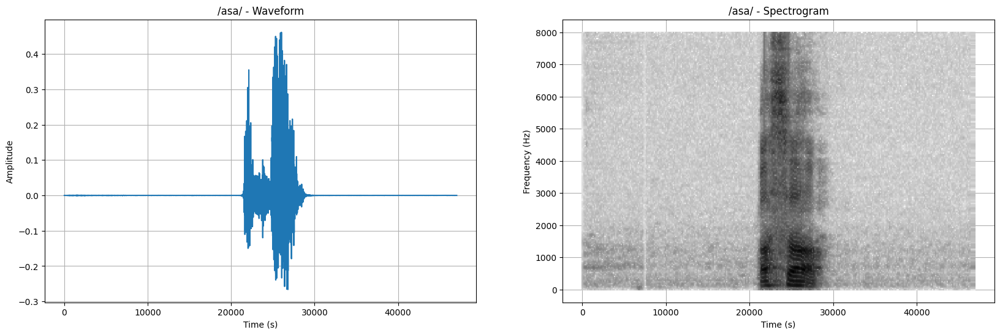

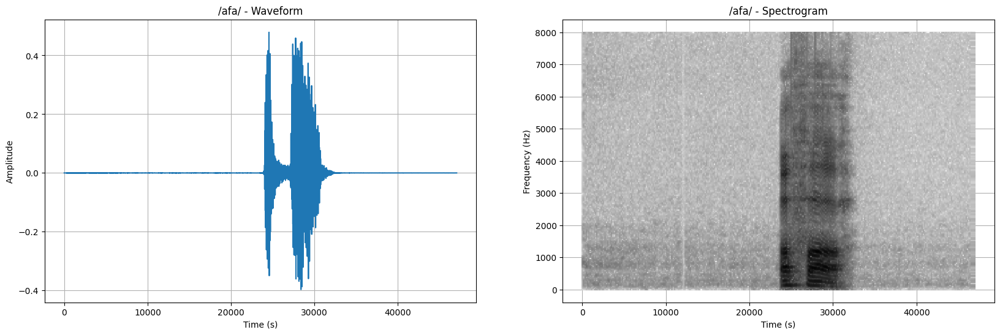

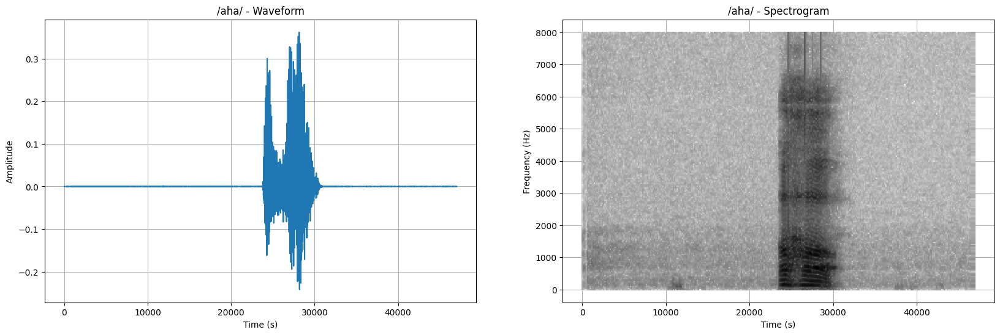

In [ ]:
wav_path='asha.wav'
sig, sr = sf.read(wav_path)

frameSize = 0.025
hopSize = 0.010
plotstft(sig, sr, frameSize, hopSize, label = '/asha/')

wav_path='asa.wav'
sig, sr = sf.read(wav_path)

frameSize = 0.025
hopSize = 0.010
plotstft(sig, sr, frameSize, hopSize, label = '/asa/')

wav_path='afa.wav'
sig, sr = sf.read(wav_path)

frameSize = 0.025
hopSize = 0.010
plotstft(sig, sr, frameSize, hopSize, label = '/afa/')

wav_path='aha.wav'
sig, sr = sf.read(wav_path)

frameSize = 0.025
hopSize = 0.010
plotstft(sig, sr, frameSize, hopSize, label = '/aha/')

<h4> <b> Part2 Report : </b>  
Write down your observations from the spectrogram analysis of speech sounds

<dt> <h4> 1. Diphthongs:  </h4> </dt>
<dd> <h4> - For /ai/ we can clearly see second formant transition from around 1100 Hz for /a/ to around 2300 Hz for /i/, also can see first formant transition going down indicating a mid vowel like /i/
</h4> - For /au/ we can see the all formant transitions are going down, not very diffrentiable but can see the second formant of /a/ around 1100 Hz transitioning to around 800 Hz which indicates a /u/ resulting in /au/</dd>


<dt> <h4> 2. Place of articulation:   </h4> </dt>
<dd> <h4> - Can observe that the gap for /p/ > gap for /t/ > gap for /k/. More gap corresponds to more closure region </h4> </dd>
<dd> <h4> - With change of vowels the formants change depending on vowel , can see for /a/ around 700-800 Hz first formant, 1100-1200 Hz second formant, /i/ : 300-400 Hz first formant, around 2000 Hz second formant, /e/: around 400 Hz first, 800 Hz second which are around the consonant /k/.</h4> </dd>

<dt> <h4> 3. Manner of articulation   </h4> </dt>
<dd> <h4> - We can clearly observe voice bar during closure regions </h4> </dd>
<dd> <h4> - We observe for /aka/ and /aga/ a sharp burst , while for /akha/ and /agha/ we observe burst followed by noised low frequency. </h4> </dd>

<dt> <h4> 4. Nasal stops </h4> </dt>
<dd> <h4> -  We can clearly see the spectral valley in spectrograms of /ana/ and /ama/ , which occurs between the first two formants.</h4> </dd>
<dd> <h4> -  We distinguish between the white patches and upon keen observation we see the drop in spectrum for /ana/ occurs at a greater frequency than /ama/ </h4> </dd>

<dt> <h4> 5. Glides </h4> </dt>
<dd> <h4> - For /aya/ we can see F1 increasing before the gap and F2 decreasing, while for /ava/ we see both F1 and F2 decreasing before the gap </h4> </dd>
<dd> <h4> - Upon extending no difference in the gap , just observe the vowel /a/ extending, which implies glides cant be extended </h4> </dd>

<dt> <h4> 6. Fricatives </h4> </dt>
<dd> <h4> - Energy is spread across various frequencies </h4> </dd>
<dd> <h4> - /s/ and /sh/ have more stronger energy spread than /afa/ due to the region decaying faster. </h4> </dd>

<h4> <b> Part3 (Cepstral Analysis) : </b>  This sections describes the steps involved in part3 of the programming assignment.  </h4>

<dt> <h4> 1. Computing the cepstrum and estimating the fundamental frequency from it </h4> </dt>

<dd> <h4> - Write a function to compute the real cepstrum from the log magnitude spectrum. </h4> </dd>
<dd> <h4> - Write a function to estimate fundamental frequency from the real cepstrum. </h4> </dd>
<dd> <h4> - Compare the pitch track obtained from cepstral analysis with that obtained from autocorrelation analysis in the 1st assignment. </h4> </dd>

<dt> <h4> 1. Analyzing the information in cepstral coefficients </h4> </dt>

<dd> <h4> - <b> Slowly varying components : </b> Reconstruct the slowly varying component of the spectrum (estimate of VT response) by retaining only the first $K$ cepstral coefficients.  </h4> </dd>
<dd> <h4> - Plot the spectrogram of the reconstruction, and compare it with the original spectrogram.  </h4> </dd>
<dd> <h4> - Study the effect of $K$, and report your observations. </h4> </dd>
<dd> <h4> - Show the spectrum of the voiced frame ( spectrogram[voiced_index] ) of the reconstructed and original spectrogram for better visualization  </h4> </dd>



<dd> <h4> - <b> Fast varying components : </b> Reconstruct the fast varying component of the spectrum (estimate of voice source) by suppressing the the first $K$ cepstral coefficients. </h4> </dd>
<dd> <h4> - Plot the spectrogram of the reconstruction, and compare it with the original spectrogram.  </h4> </dd>
<dd> <h4> - Study the effect of $K$, and report your observations. </h4> </dd>
<dd> <h4> - Show the spectrum of the voiced frame ( spectrogram[voiced_index] ) of the reconstructed and original spectrogram for better visualization  </h4> </dd>





In [6]:
from scipy.fftpack import idct
from scipy.fftpack import dct

import numpy as np
import soundfile as sf
from numpy.lib import stride_tricks

def stft(sig, rate, frameSize ,hopSize ,window=np.hanning):

    #1.Segment the speech signal into short time frames ( You may use "stride_tricks.as_strided" with appropriate arguments )
    frameSize = int(rate * frameSize)
    hopSize = int(rate * hopSize)

    num_frames = 1 + (len(sig) - frameSize) // hopSize
    shape = (num_frames, frameSize)
    strides = (sig.strides[0] * hopSize, sig.strides[0])

    Frames = stride_tricks.as_strided(sig, shape=shape, strides=strides).copy()

    win = window(frameSize)

    #2.Multiply the frames with the window ( i.e rectangular, hamming, hanning etc )
    windowed_frames = [frame * win for frame in Frames]

    #3.Compute N-point DFT of of the frames ( You may use "np.fft.rfft" with appropriate arguments )
    NFFT = 512
    mag_frames = [np.fft.rfft(windowed_frame, NFFT) for windowed_frame in windowed_frames]

    #4.Compute Log magnitude spectrum of the frames in decibles
    log_spec = np.array([np.log10(np.abs(frame)) for frame in mag_frames])

    #5.Return Log magnitude spectrogram
    return log_spec






def RealCeps(log_spec):
    ##########################################################
    #Compute the real cepstrum from the log magnitude spectrum. You may use "from scipy.fftpack import idct" to achieve this.

    return idct(log_spec)

    ##########################################################
    #Return the computed cepstrum
    ##########################################################


def ReconstructLogSpec(cepstrum,K1,K2):
    ##########################################################
    #Reconstruction of the log spectrogram from the cepstrum
    #1. Kept only K2 cepstral coefficients starting from K1'th cepstral coefficients
    #      - Keep a few cepstral coefficients, fill zeros at remaining positions, and use "from scipy.fftpack import dct"" to restore the log spectrogram
    ##########################################################
    #You may use the below-commented code or write your code.
    cepstrum_part=np.zeros_like(cepstrum)
    cepstrum=cepstrum[:,K1:K1+K2]
    cepstrum_part[:,K1:K1+K2]=cepstrum
    rec_logspec=dct(cepstrum_part, type=1, axis=1)

    return rec_logspec
    ##########################################################
    #Complete the code
    ##########################################################








    ##########################################################
    #Return the reconstructed log spectrogram
    #If you want, you can restore the spectrogram from the log spectrogram using pow(10,logspec)
    ##########################################################

F0: 183.90804597701148


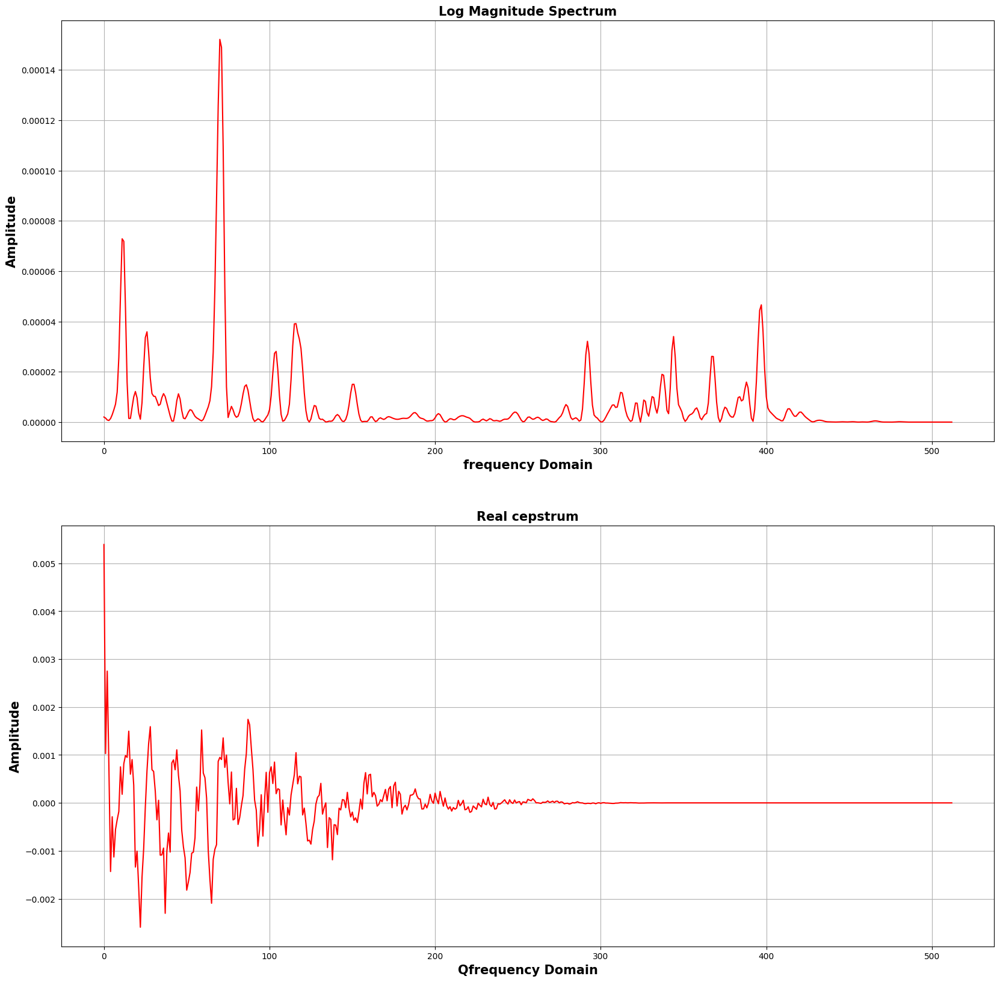

In [14]:
##########################################################
#This section aims to estimate the fundamental frequency from the real cepstrum
##########################################################

##########################################################
#1.Load wave file
#2.Compute log spectrogram and cepstrum
##########################################################

wav_path='male_a.wav'
sig, sr = sf.read(wav_path)

frameSize = 0.025
hopSize = 0.010

logspec = stft(sig, sr, frameSize, hopSize)
cepstrum = RealCeps(logspec)

##########################################################
#This block of code is for visualizing the ceptrum
#100 th (i.e voiced) frame is taken for visualization. You may change the frame number to visualize the voiced frame of your example
##########################################################

fig, ax = plt.subplots(2,1,figsize=(20,20))
ax[0].plot(logspec[100],"r") #100 th (i.e voiced) frame is taken for visualization
ax[0].grid()
ax[0].set_title('Log Magnitude Spectrum',weight = 'bold',fontsize=15)
ax[0].set_xlabel("frequency Domain",fontsize=15,weight = 'bold')
ax[0].set_ylabel("Amplitude",fontsize=15,weight = 'bold')

ax[1].plot(cepstrum[100],"r") #100 th (i.e voiced) frame is taken for visualization
ax[1].grid()
ax[1].set_title('Real cepstrum',weight = 'bold',fontsize=15)
ax[1].set_xlabel("Qfrequency Domain",fontsize=15,weight = 'bold')
ax[1].set_ylabel("Amplitude",fontsize=15,weight = 'bold')

##########################################################
#1.Estimate the fundamental frequency from the cepstrum
#2.Compare it with fundamental frequency estimation using autocorrelation method
##########################################################

def estimate_f0(cepstrum):

  sr = 16000
  min_index =20

  peak = np.argmax(cepstrum[min_index:]) + min_index

  f0 = sr / peak
  return f0

print(f'F0: {estimate_f0(cepstrum[100])}')

<Figure size 5000x1000 with 0 Axes>

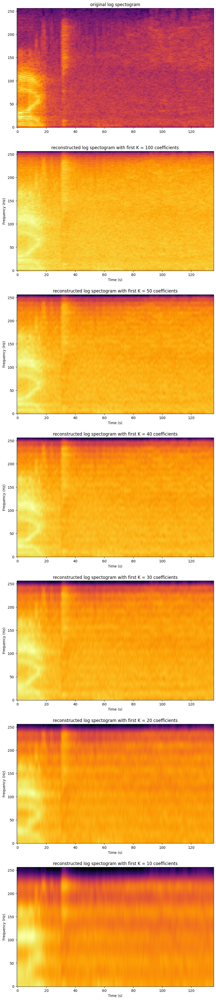

In [ ]:
##########################################################
#Extracting slowly varying components
##########################################################
K_list=[100,50,40,30,20,10] # Number of first "K" cepstral coefficients to preserve while reconstructing the log spectrum from cepstrum
fig = plt.figure(figsize=(50, 10))

wav_path='male_a.wav'
sig, sr = sf.read(wav_path)

frameSize = 0.025
hopSize = 0.010

logspec = stft(sig, sr, frameSize, hopSize)
cepstrum = RealCeps(logspec)

fig, ax = plt.subplots(len(K_list)+1,1,figsize=(10,50))

ax[0].imshow(logspec.T, aspect = 'auto', origin = 'lower', cmap = 'inferno')
ax[0].set_title(f'original log spectogram')
for i, k in enumerate(K_list):

   reconstructed_logspec  = ReconstructLogSpec(cepstrum, 0, k)

   ax[i+1].imshow(reconstructed_logspec.T, aspect = 'auto', origin = 'lower', cmap = 'inferno')
   ax[i+1].set_title(f'reconstructed log spectogram with first K = {k} coefficients')
   ax[i+1].set_ylabel('Frequency (Hz)')
   ax[i+1].set_xlabel('Time (s)')

plt.show()



<Figure size 5000x1000 with 0 Axes>

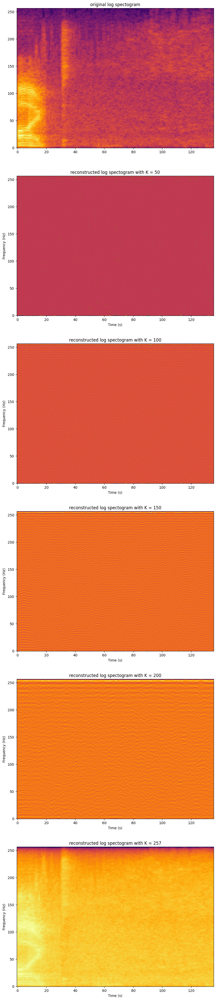

In [ ]:
# @title Default title text
##########################################################
#Extracting fast varying components
##########################################################

K_list=[50,100,150,200,len(cepstrum[0])] # Number of first "K" cepstral coefficients to preserve while reconstring the log spectrum from cepstrum
#len(cepstrum[0]) outputs the number of cepstral coefficients

##########################################################
#Define the subplots
##########################################################
fig = plt.figure(figsize=(50, 10))

wav_path='male_a.wav'
sig, sr = sf.read(wav_path)

frameSize = 0.025
hopSize = 0.010

logspec = stft(sig, sr, frameSize, hopSize)
cepstrum = RealCeps(logspec)

fig, ax = plt.subplots(len(K_list)+1,1,figsize=(10,50))

ax[0].imshow(logspec.T, aspect = 'auto', origin = 'lower', cmap = 'inferno')
ax[0].set_title(f'original log spectogram')

for i, k in enumerate(K_list):

   reconstructed_logspec  = ReconstructLogSpec(cepstrum, len(cepstrum[0])-k, len(cepstrum[0]))

   ax[i+1].imshow(reconstructed_logspec.T, aspect = 'auto', origin = 'lower', cmap = 'inferno')
   ax[i+1].set_title(f'reconstructed log spectogram with K = {k}')
   ax[i+1].set_ylabel('Frequency (Hz)')
   ax[i+1].set_xlabel('Time (s)')

plt.show()

<h4> <b> Part3 Report : </b>  
Write down your observations from the cepstral analysis

<dt> <h4> 1. Observations of the fundamental frequency estimation from cepstrum     </h4> </dt>
<dd> <h4> - removing first 20 ceptral coefficients and then taking maximum of remaining coeffiecients gives the location of peak corresponding to the fundamental frequency, gives around 183 Hz as the fundamental frequency </h4> </dd>

<dt> <h4> 2. Observations from the cepstral analysis    </h4> </dt>
<dd> <h4> -  Using first 'k' coefficients we can see increasing k makes formants more clearly visible</h4> </dd>
<dd> <h4> -  Using last 'k' coefficients we can see ponly when using all k = 257 we get a good spectrogram plot, this is because last k correspond to high time cepstrum thus looking like above. </h4> </dd>


<h4> <b> Part4 (Feature extraction) : </b>  This section describes the steps involved in extracting MFCC features and Cepstral Mean Variance Normalization (CMVN) processing and also guides the analysis of the information in MFCCs. </h4>


<dt> <h4> 0. Relation between Mel and linear scale  </h4> </dt>
<dd> <h4> - Convert Hertz (f) to Mel (m) scale : m = 2595 $log_{10}$ (1+$\frac{f}{700}$) </h4> </dd>
<dd> <h4> - Convert Mel (m) to Hertz (h) : f = $700(10^{\frac{m}{2595}}-1)$ </h4> </dd>

<dt> <h4> 1. Extracting and inverting the log-Mel-filterbank energy coefficients  </h4> </dt>

<dd> <h4> - Write a function to compute log-Mel-filterbank energy coefficients by warping the power-spectrum along the Mel-axis. Please note the function for Mel-weights is provided herewith.  </h4> </dd>
<dd> <h4> - Reconstruct the linear spectrogram from the log-Mel-filterbank energy coefficients and plot it.  </h4> </dd>
<dd> <h4> - Compare the reconstructed spectrogram with the original spectrogram, and report your observations.  </h4> </dd>

<dt> <h4> 2. Extracting and inverting the Mel frequency cepstral coefficients (MFCCs) </h4> </dt>


<dd> <h4> - Write a function to compute Mel frequency cepstral coefficients (MFCCs) by taking discrete cosine transform of the log-Mel-filterbank energy coefficients.  </h4> </dd>

<dd> <h4> - <b> Spectrogram  reconstruction from MFCC: </b> Reconstruct the spectrogram by retaining only the first $K$ MFCC coefficients in the cepstral domain, ie., MFCC -> log-Mel-filterbank ->spectrogram. Plot the reconstruction and compare it with the original spectrogram. Study the effect of $K$ and report your observations.  </h4> </dd>

<dd> <h4> - <b> Signal reconstruction from MFCC: </b> Reconstruct the wavefrom from MFCC by retaining the first $K$ coefficients. MFCC -> log-Mel-filterbank -> spectrogram -> speech signal (Griffin-Lim). Listen to the reconstructions for different $K$ and report your observations.   </h4> </dd>

<dt> <h4> 3. Extracting Cepstral Mean Variance Normalization (CMVN) features and delta and acceleration coefficients from cepstral/MFCC features  </h4> </dt>

<dd> <h4> - Write a function to implement CMVN for channel normalization.    </h4> </dd>

<dd> <h4> - Write a function to extract delta and acceleration coefficients from cepstral/MFCC features.    </h4> </dd>





136 (40,)
(136, 513)


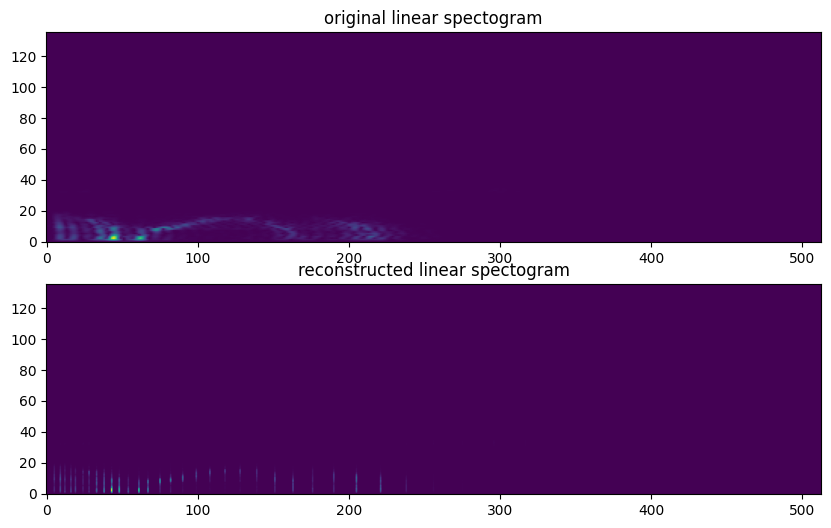

In [80]:
###################### Skeleton Code for Part4 #################################
import numpy as np
import soundfile as sf
from numpy.lib import stride_tricks
from scipy.fftpack import dct
from scipy.fftpack import idct
import matplotlib.pyplot as plt
from scipy.optimize import nnls

##########################################################
#Write a function to compute the power spectrogram (This function is slightly different from one written in part1/part2)
##########################################################
def stft(sig, rate, frameSize ,hopSize ,window=np.hanning):

    frameSize = int(rate * frameSize)
    hopSize = int(rate * hopSize)

    win = window(frameSize)

    num_frames = 1 + (len(sig) - frameSize) // hopSize
    shape = (num_frames, frameSize)
    strides = (sig.strides[0] * hopSize, sig.strides[0])

    ##########################################################
    #Steps
    #1.Segment the speech signal into short time frames ( You may use "stride_tricks.as_strided" with appropriate arguments )
    Frames = stride_tricks.as_strided(sig, shape=shape, strides=strides).copy()

    #2.Multiply the frames with the window ( i.e rectangular, hamming, hanning etc )
    windowed_frames = [frame * win for frame in Frames]

    #3.Compute N-point DFT of of the frames ( You may use "np.fft.rfft" with appropriate arguments )
    NFFT = 512
    mag_frames = [np.fft.rfft(windowed_frame, 1024) for windowed_frame in windowed_frames]

    #4.Compute magnitude spectrum of the frames
    mag_spec = np.array([np.abs(frame) for frame in mag_frames])

    #5.Compute the power spectrum of the frames
    power_spec = mag_spec **2

    #6.Return power spectrum of the frames
    return power_spec
    ##########################################################
    ##########################################################

##########################################################
#Load wavefile
##########################################################
wav_path='male_a.wav'
sig, sr = sf.read(wav_path)

##########################################################
#Compute power spectrogram of the speech signal
##########################################################
frameSize = 0.025
hopSize = 0.010
pow_frames = stft(sig, sr, frameSize,hopSize)

##########################################################
#Filter Bank
##########################################################
#You may change this arguments based on your requirement
sample_rate=16000
nfilt=40
NFFT=1024

##########################################################
#Code to define the "fbank" matrix
#"fbank" matrix is multiplied with the power spectrogram to compute Mel filter bank energy coefficients
##########################################################

low_freq_mel = 0
high_freq_mel = (2595 * np.log10(1 + (sample_rate / 2) / 700))  # Convert Hz to Mel
mel_points = np.linspace(low_freq_mel, high_freq_mel, nfilt + 2)  # Equally spaced in Mel scale
hz_points = (700 * (10**(mel_points / 2595) - 1))  # Convert Mel to Hz
bin = np.floor((NFFT + 1) * hz_points / sample_rate) # Convert Hz to fft points
fbank = np.zeros((nfilt, int(np.floor(NFFT / 2 + 1))))
for m in range(1, nfilt + 1):
    ############## (m-1), (m) and (m+1) points and assign linearly increasing weights in the range (m-1) ---> (m) and linearly decreasing weights in the range (m) ---> (m+1)
    f_m_minus = int(bin[m - 1])   # left
    f_m = int(bin[m])             # center
    f_m_plus = int(bin[m + 1])    # right
    for k in range(f_m_minus, f_m):
        fbank[m - 1, k] = (k - bin[m - 1]) / (bin[m] - bin[m - 1])
    for k in range(f_m, f_m_plus):
        fbank[m - 1, k] = (bin[m + 1] - k) / (bin[m + 1] - bin[m])

##########################################################
#Multiply the "fbank" matrix with the power spectrogram to compute Mel filter bank energy coefficients
##########################################################

mel_energy_coefficients = [np.dot(fbank,frame) for frame in pow_frames]

##########################################################
#Compute log Mel filter bank energy coefficients. You may add small noise to avoid log(0) issue.
##########################################################

log_mel_energy_coefficients = [np.log10(frame+1e-6) for frame in mel_energy_coefficients]
print(len(log_mel_energy_coefficients), log_mel_energy_coefficients[0].shape)

def pinverse(fbank):

    nfft_bins = fbank.shape[1]
    nfilt = fbank.shape[0]


    I = np.eye(nfilt)

    # Initialize an empty list to store the solution X
    fbank_nnls_inv = np.zeros((nfft_bins, nfilt))

    # Solve for each column of I
    for i in range(nfilt):
        b = I[:, i]  # Extract the i-th column of the identity matrix
        fbank_nnls_inv[:, i], _ = scipy.optimize.nnls(fbank, b)

    return fbank_nnls_inv

##########################################################
#Write a function to reconstruct the linear spectrogram from the log mel filter bank energy coefficients
##########################################################
def ReconstructSpect(LogMelFilterBank, fbank):
    ############################################################################
    #Steps
    #1.Invert the log operation ( you may use "pow(10,LogMelFilterBank)" )
    #2.Use the Non-negative Least Mean Square (NLMS) algorithm to reconstruct the linear spectrogram from mel filter bank energy coefficients
    #3.Return the reconstructed linear spectrogram
    ############################################################################

    inverse_log_mel_coefficients = pow(10, LogMelFilterBank)


    fbank_nnls_inv = pinverse(fbank)
    reconstructed_linearspec = np.dot(fbank_nnls_inv, inverse_log_mel_coefficients)

    return np.sqrt(reconstructed_linearspec)




##########################################################
#Write a function to Mel frequency cepstral coefficients ( MFCCs )
##########################################################
def ComputeMFCC(LogMelFilterBank):
    ###########################################################################
    #Steps
    #1.You may use "idct" with appropriate arguments
    #2.Return Mel frequency cepstral coefficients ( MFCCs )
    ###########################################################################

    return idct(LogMelFilterBank)



##########################################################
#Write a function to reconstruct the linear spectrogram from Mel frequency cepstral coefficients ( MFCCs )
##########################################################
def ReconstructSpectFromMFCC(LogMelFilterBank, K, fbank):
    ###########################################################################

    MFCC = ComputeMFCC(LogMelFilterBank)
    #1.Preserve the first "K" cepstral coefficients in MFCC
    MFCC_part = np.zeros_like(MFCC)

    MFCC_part[:K] = MFCC[:K]

    #2.Invert the dct opration with appropriate scaling
    inverted_MFCC = dct(MFCC_part)
    inverted_MFCC = pow(np.e, inverted_MFCC)
    fbank_nnls_inv = pinverse(fbank)

    reconstructed_linearspec = np.sqrt(np.dot(fbank_nnls_inv, inverted_MFCC))
    #4.Return the reconstructed linear spectrogram
    return reconstructed_linearspec

def ReconstructSignal(MagSpec):

    ##########################################################
    #Steps
    phase = np.exp(2j * np.pi * np.random.rand(*MagSpec.shape))

    spec = MagSpec * phase

    signal = np.fft.ifft(spec, 512)

    for i in range(20):
      # Perform STFT on the signal
      spec = np.fft.fft(signal, 512)

      # Compute the magnitude of the STFT
      mag_spec = np.abs(spec)

      # Update the phase while keeping the magnitude same
      phase = np.exp(1j * np.angle(spec))
      spec = mag_spec * phase

      # Inverse STFT to reconstruct the signal
      signal = np.fft.ifft(spec, 512)

    return signal

##########################################################
#Write a function to reconstruct the waveform from Mel frequency cepstral coefficients ( MFCCs )
##########################################################
def ReconstructWaveFromMFCC(LogMelFilterBank, K, fbank):
    ###########################################################################
    #Steps
    reconstructed_linearspec = ReconstructSpectFromMFCC(LogMelFilterBank, K, fbank)


    return ReconstructSignal(reconstructed_linearspec)
    ###########################################################################



##########################################################
#Write a function to compute CMVN features from the Mel frequency cepstral coefficients ( MFCCs )
##########################################################
def ComputeCMVN(MFCC,MeanNormalizre=True,VarNormalize=True):

  MFCC = MFCC.T

  for frame in MFCC:

    mean = np.mean(frame)

    var = np.var(frame)

    if MeanNormalizre:
      frame -= mean

    if VarNormalize:
      frame /= np.sqrt(var)

  return MFCC.T
    ###########################################################################
    #Compute the CMVN features with specific window length
    ###########################################################################


##########################################################
#Write a function to add delta and acceleration coefficients to MFCCs
##########################################################
def addDelta(MFCC):

  MFCC = MFCC.T
  K = MFCC.shape[1]

  for index, frame in enumerate(MFCC):

    delta_frame = np.diff(MFCC)
    delta_delta_frame = np.diff(delta_frame)

  return [ MFCC, delta_frame, delta_delta_frame ]




    ############################################################################
    #Steps
    #1.Compute delta coefficients and delta-delta (i.e acceleration) coefficients
    #2.Add delta and delta-delta ( i.e acceleration ) coefficients to original Mel cepstral coefficients
    #3.Return delta and delta-delta added coefficients
    ############################################################################

# ############################################################################
# #Plot original linear spectrogram and reconstructed linear spectrogram from Mel-filter bank coefficients and compare them
# ############################################################################
frameSize = 0.025
hopSize = 0.010
pow_frames = stft(sig, sr, frameSize,hopSize)

linear_spectra = np.sqrt(pow_frames)
print(linear_spectra.shape)

# Compute Mel filter bank energy coefficients
mel_energy_coefficients = [np.dot(fbank,frame) for frame in pow_frames]

log_mel_energy_coefficients = [np.log10(frame+1e-6) for frame in mel_energy_coefficients]

reconstructed_linear_spectra = np.array([ReconstructSpect(frame, fbank) for frame in log_mel_energy_coefficients])

fig, ax = plt.subplots(2, 1, figsize=(10,6))

#plot linear spectra
ax[0].imshow(linear_spectra, aspect = 'auto', origin = 'lower')
ax[0].set_title(f'original linear spectogram')

#plot reconstructed linear spectra
ax[1].imshow(reconstructed_linear_spectra, aspect = 'auto', origin = 'lower')
ax[1].set_title(f'reconstructed linear spectogram')
plt.show()


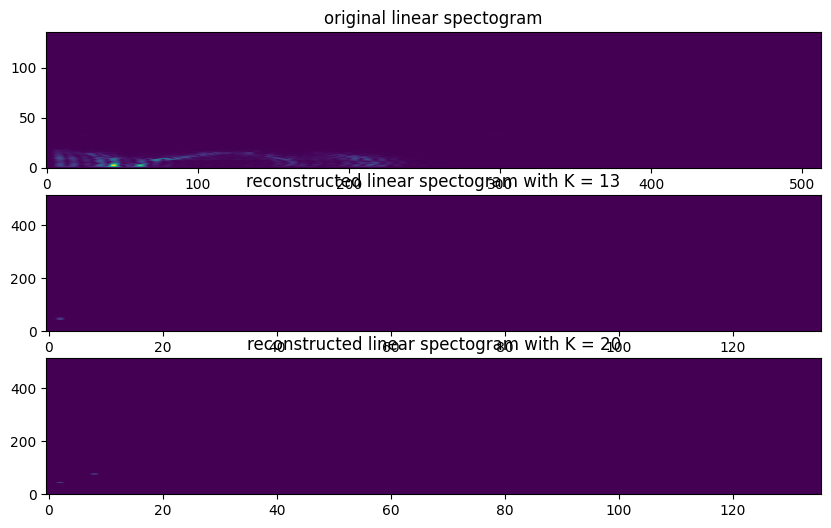

In [83]:
# ############################################################################
# #Plot original linear spectrogram and reconstructed linear spectrogram from Mel cepstral coefficients for different K and compare them
# ############################################################################
fig, ax = plt.subplots(3, 1, figsize=(10,6))
#plot linear spectra
ax[0].imshow(linear_spectra, aspect = 'auto', origin = 'lower')
ax[0].set_title(f'original linear spectogram')

#plot reconstructed linear spectra
for index, k in enumerate([13, 20]):

  reconstructed_linear_spectra = np.array([ReconstructSpectFromMFCC(frame, k, fbank) for frame in log_mel_energy_coefficients])
  ax[index + 1].imshow(reconstructed_linear_spectra.T, aspect = 'auto', origin = 'lower')
  ax[index + 1].set_title(f'reconstructed linear spectogram with K = {k}')

plt.show()


/usr/local/lib/python3.10/dist-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
/usr/local/lib/python3.10/dist-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


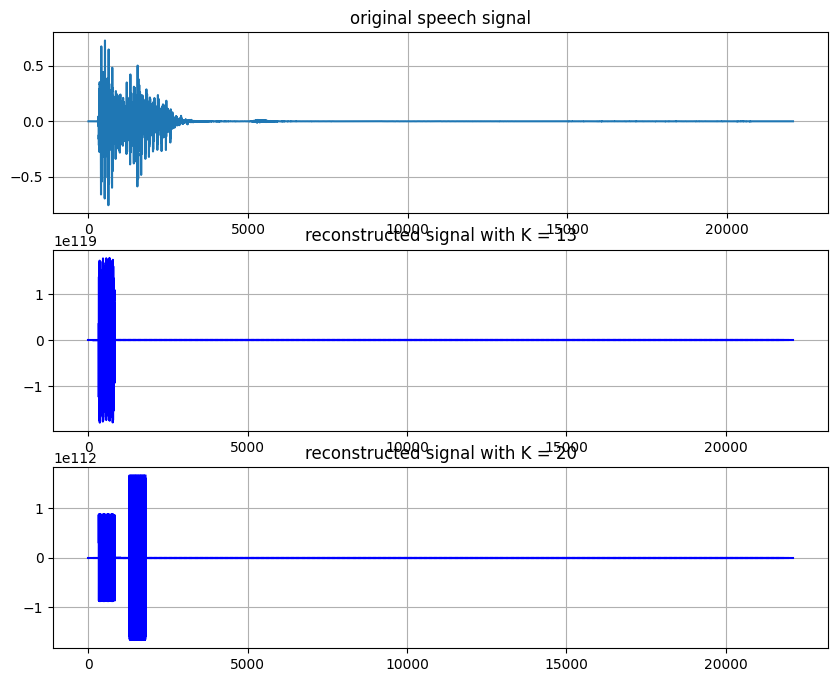

In [79]:
# ############################################################################
# # Listen to the reconstructed speech signal from Mel cepstral coefficients ( for different K ) and compare it with the original speech signal
# ############################################################################
fig, ax = plt.subplots(3, 1, figsize=(10,8))

ax[0].plot(sig)
ax[0].set_title('original speech signal')
ax[0].grid()

for i, k in enumerate([13, 20]):

  reconstructed_wave_signal = [ReconstructWaveFromMFCC(frame, k, fbank) for frame in log_mel_energy_coefficients]

  for index, frame in enumerate(reconstructed_wave_signal):

    start = index*int(hopSize * sr)
    end = start + len(frame)

    ax[i+1].plot(range(start, end), frame, c = 'b')
    ax[i+1].set_title(f'reconstructed signal with K = {k}')

  ax[i+1].grid()

<h4> <b> Part4 Report : </b>  
Write down your observations from the MFCC feature extraction and reconstruction of the waveform from MFCC features.

<dt> <h4> 1. Observations of the reconstruction of linear spectrogram from log Mel filter bank energy coefficients     </h4> </dt>
<dd> <h4> - Faintly visible lines which resemble the original linear spectrogram  </h4> </dd>

<dt> <h4> 2. Observations of the reconstruction of linear spectrogram from Mel frequency cepstral coefficients (MFCCs)  </h4> </dt>
<dd> <h4> -  Lines are not visible very clearly but patches can be seen along the lines corresponding to linear spectrogram</h4> </dd>
<dd> <h4> - lower k has formant better visible as compared to higher k</h4> </dd>
<dt> <h4> 3. Observations from the reconstructed wave files from Mel frequency cepstral coefficients (MFCCs)  </h4> </dt>

<dd> <h4> -Better reconstruction with higher K value </h4> </dd>
